## Final Project Submission

Please fill out:
* Student name: Jack Locke
* Student pace: Self-pace
* Scheduled project review date/time: Tuesday, January 21, 9:45 am
* Instructor name: Jeff Herman
* Blog post URL: https://johnlocke333.github.io/my_data_science_decision


## Module 1 Project: King County Housing Prices

 Objective: To predict a houses sale price by creating a multivariate linear regression model.

#### Background of King County Housing:

                              Visual Representation of King County

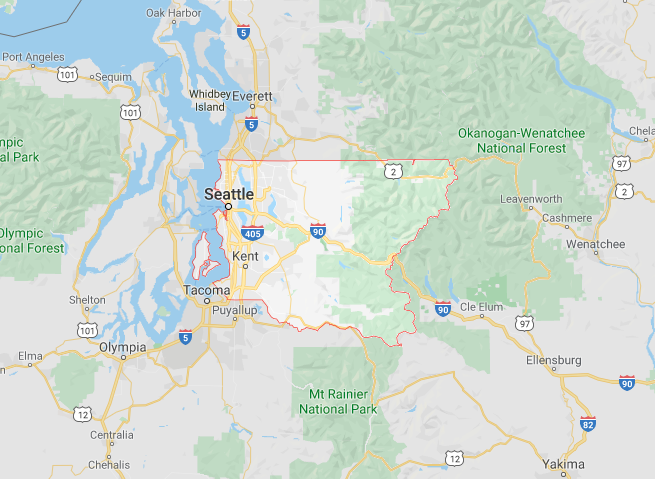

King County is located in Washington and has an estimated population of 2,233,163 people. The major metropolitan area located in King County is Seattle, which will clearly have an impact on our data. As for housing, the area has an estimated 952,569 houses with a median value of $446,600. (https://www.census.gov/quickfacts/fact/table/kingcountywashington,US/PST045218 ; data is from 2018)



### OSEMN Data Science Workflow:

#### Part 1 - Obtain: 
* 1.1 - Load Libraries
* 1.2 - Load Data
* 1.3 - Look at Summary Statstics

#### Part 2 - Scrub:
* 2.1 - Deal with Missing/Null Values
    * 2.1.1: Dealing with 'waterfront' missing values
    * 2.1.2: Dealing with missing view values
    * 2.1.3: Dealing with yr_renovated missing values
* 2.2: Dealing with extraneous values and datatypes
* 2.3: Dealing with Multicollinearity

#### Part 3 - Explore:
* 3.1: Questions
    * 3.1.1: How does the location of the house affect price? 
    * 3.1.2: How does the condition of the house affect price?
    * 3.1.3: What is the relationship between the size of a home and the price?
* 3.2: Checking Assumptions before we run our model
    * 3.2.1: Remove Outliers
    * 3.2.2: Checking for Linearity, Normality, and Homoscedasticity
    * 3.2.3: Normalizing and scaling features
* 3.3: Dealing with Categorical Variables

#### Part 4 - Model:
* 4.1: Initial model
* 4.2: Stepwise Selection
* 4.3: Model Validation

#### Part 5 - Interpretation:
* Conclusion

## Part 1:
    
#### 1.1: Load Libraries

In [1]:
#Import all of the necessary libraries that will be used in our MLR predictive model
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
!pip install folium
import folium
%matplotlib inline

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import mean_squared_error

import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy.stats as stats

import statsmodels.stats.api as sms
from statsmodels.formula.api import ols

#### 1.2: Load Data

In [2]:
#Loading in the data and see the first 5 rows
df = pd.read_csv('kc_house_data.csv')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


From first glance I can already see there are missing values in our data set (NaN), such as waterfront and yr_renovated. I also see features that seem to be very similar such as sqft_above, sqft_basement, etc. and zipcode, lat, long.

#### 1.3: Look at Summary Statistics

In [3]:
#View columns in the dataframe
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

I just wanted to get a view of all of the features that we will start with in our data set.

In [4]:
#Basic information on columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


After looking further, we see that there are 21,597 total data points and 21 total columns in our data set. We have two object variables with date and sqft_basement. Additionally, we see that waterfront, view, and yr_renovated have missing data. We will review over these summary stastics again after we scrub our dataset. 

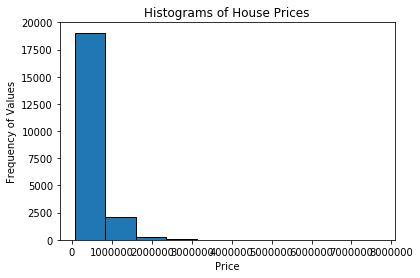

In [5]:
#Histogram of Price
plt.hist(df['price'], bins = 10, edgecolor='black')

plt.xlabel('Price')
plt.ylabel('Frequency of Values')
plt.title('Histograms of House Prices')
plt.show()

In [6]:
#Median for price
df['price'].median()

450000.0

I just wanted to create an initial visualization of the prices of houses and the frequency in which they occur. The median price is 450,000, comparing this to our histogram, we can see there must be some severe outliers since most houses are below 100,000.  Food for thought, before we start to scrub and analyze our data!

## Part 2: Scrubbing the Data

In [7]:
#Describe the dataframe
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


I wanted to first see a description of the data so that I can then assess the difference before and after I clean the data. 

In [8]:
#Drop 'id' from dataframe
df = df.drop('id', axis=1)
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


Initally, I want to drop the column labeled 'id' because this is just an identifier column and will have no affect on our predictive model. 

#### 2.1: Dealing with missing/null values

In [9]:
#See Boolean values for missing/null columns
df.isna().any()

date             False
price            False
bedrooms         False
bathrooms        False
sqft_living      False
sqft_lot         False
floors           False
waterfront        True
view              True
condition        False
grade            False
sqft_above       False
sqft_basement    False
yr_built         False
yr_renovated      True
zipcode          False
lat              False
long             False
sqft_living15    False
sqft_lot15       False
dtype: bool

As we can see, we have three columns with missing values (waterfront, view, and yr_renovated). Now, let's see how many missing values of each we have

In [10]:
#See the sum of the missing/null values
df.isna().sum()

date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

#### 2.1.1: Dealing with 'waterfront' missing values

In [11]:
#See percentage of missing values and amount of unique values
print('Percent of missing values: ', len(df[df.waterfront.isna()]) / len(df))
print('Amount of unique values: ', df.waterfront.nunique())

Percent of missing values:  0.11001527989998611
Amount of unique values:  2


The percent of missing values is small so we will not cosinder removing this column. More interestingly, there are only two unique values. After looking back at the table we can see the two values as 0 and 1 standing for either being on the waterfront or not being on the waterfront. Let's take a look at the histogram to see how many we have of the two.

/Users/jacklocke/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/jacklocke/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


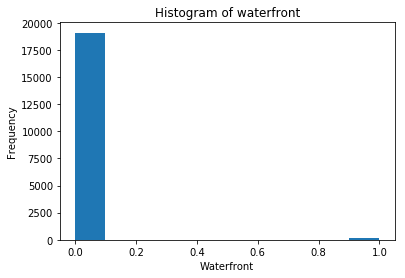

0.0    19075
1.0      146
Name: waterfront, dtype: int64

In [12]:
#Histogram of 'waterfront'
plt.hist(df.waterfront)
plt.title('Histogram of waterfront')
plt.xlabel('Waterfront')
plt.ylabel('Frequency')
plt.show()

#View value count
df['waterfront'].value_counts()

As can be assumed, a vast majority of the houses are not on a waterfront so I feel comfortable replacing these missing values with 0.

In [13]:
#Fill missing values with zero
df['waterfront'] = df['waterfront'].fillna(0)
df.isna().sum()

date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront          0
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

#### 2.1.2: Dealing with missing view values

We already know we will not remove the view column because it has significantly less values than waterfront. But, let's look at the unique values.

5

0.0    19422
2.0      957
3.0      508
1.0      330
4.0      317
Name: view, dtype: int64

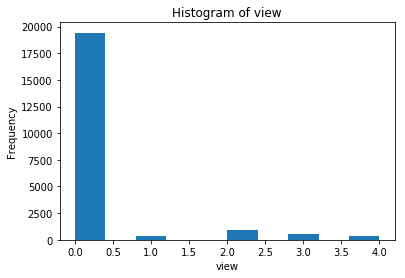

In [14]:
#Show unique values and value count
display(df.view.nunique())
display(df.view.value_counts())

#Histogram of 'view'
plt.hist(df.view)
plt.title('Histogram of view')
plt.xlabel('view')
plt.ylabel('Frequency')
plt.show()

19422 values out of 21534 are 0 so we can confidently replace our 63 missing values with 0 because it will not affect our model. 

In [15]:
#Replace missing values with zero
df['view'] = df['view'].fillna(0)
df.isna().sum()

date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront          0
view                0
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

#### 2.1.3: Dealing with yr_renovated missing values

yr_renovated has 3842 missing values which is relatively close to waterfront(11%) so again we will not consider dropping this column. 

70

0.0       17011
2014.0       73
2003.0       31
2013.0       31
2007.0       30
2000.0       29
2005.0       29
1990.0       22
2004.0       22
2009.0       21
1989.0       20
2006.0       20
2002.0       17
1991.0       16
1998.0       16
1984.0       16
1999.0       15
2008.0       15
2010.0       15
2001.0       15
1983.0       15
2015.0       14
1985.0       14
1986.0       14
1987.0       14
1994.0       14
1992.0       13
1993.0       12
1997.0       12
1995.0       12
          ...  
1975.0        5
1964.0        5
1969.0        4
1963.0        4
1973.0        4
1981.0        4
1965.0        4
1978.0        3
1960.0        3
1958.0        3
1956.0        3
1955.0        3
1945.0        3
1972.0        3
1967.0        2
1957.0        2
1940.0        2
1974.0        2
1962.0        2
1953.0        1
1950.0        1
1934.0        1
1944.0        1
1976.0        1
1948.0        1
1946.0        1
1959.0        1
1971.0        1
1951.0        1
1954.0        1
Name: yr_renovated, Leng

Percent of 0.0 Values:  0.787655692920313


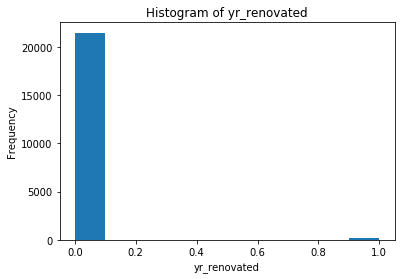

In [16]:
#See unique values, value counts, and percent of zero values in 'yr_renovated'
display(df.yr_renovated.nunique())
display(df.yr_renovated.value_counts())
print("Percent of 0.0 Values: ", len(df[df.yr_renovated == 0 ]) / len(df))

#Histogram of 'waterfront'
plt.hist(df.waterfront)
plt.title('Histogram of yr_renovated')
plt.xlabel('yr_renovated')
plt.ylabel('Frequency')
plt.show()

Almost 80% of the yr_renovated values are 0 so once again I am going to replace these missing values with 0 as it will have no affect on our predictive model. 

In [17]:
#Replace missing values with zero
df['yr_renovated'] = df['yr_renovated'].fillna(0)
df.isna().sum()

date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

Now, we can see that we have dealt with all missing values in our dataset. Next we need to check for placeholder values and datatypes.

#### 2.2: Dealing with extraneous values and datatypes

In [18]:
#Check dataframe information again
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null float64
view             21597 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(10), object(2)
memory usage: 3.3+ MB


One thing that stood out to me right away was the '?' seen in sqft_basement. Sqft_basement seems to be numerically based data and is only seen as an object due to the strings. So we need to replace the '?' with the appropiate values and change the datatype to a float.

In [19]:
#See value count and unique values
display(df['sqft_basement'].value_counts())
df['sqft_basement'].nunique()

0.0       12826
?           454
600.0       217
500.0       209
700.0       208
800.0       201
400.0       184
1000.0      148
300.0       142
900.0       142
200.0       105
750.0       104
450.0       103
530.0       103
480.0       103
720.0        98
620.0        90
580.0        84
840.0        83
420.0        81
860.0        79
1100.0       78
670.0        78
550.0        76
780.0        76
650.0        75
240.0        74
680.0        73
380.0        73
850.0        72
          ...  
176.0         1
935.0         1
2310.0        1
3500.0        1
2180.0        1
2730.0        1
1481.0        1
1880.0        1
506.0         1
475.0         1
225.0         1
1281.0        1
243.0         1
2600.0        1
2050.0        1
768.0         1
516.0         1
2390.0        1
915.0         1
906.0         1
417.0         1
2190.0        1
2610.0        1
588.0         1
4130.0        1
1548.0        1
862.0         1
1248.0        1
1275.0        1
2250.0        1
Name: sqft_basement, Len

304

There are only 454 values containing '?' with a majority of those values being zero. Therefore, it is safe to replace our '?' with zero and then change the datatype to float so it is the same as the rest of the values in our column sqft_basement.

In [20]:
#Replace '?' with zeros
df['sqft_basement'] = (df['sqft_basement'].replace('?', 0)).astype('float64')
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null float64
view             21597 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(9), int64(10), object(1)
memory usage: 3.3+ MB


None

Now we can see that sqft_basement is not a float and the only object remaining in our dataset is date. 

Now let's view the dataset to find if there are any other extraneous values.

In [21]:
#Loop through features to get value counts to see if anything else stands out
for col in df.columns:
    print(col, '\n', df[col].value_counts(normalize=True).head(), '\n\n')

date 
 6/23/2014    0.006575
6/26/2014    0.006066
6/25/2014    0.006066
7/8/2014     0.005880
4/27/2015    0.005834
Name: date, dtype: float64 


price 
 350000.0    0.007964
450000.0    0.007964
550000.0    0.007362
500000.0    0.007038
425000.0    0.006945
Name: price, dtype: float64 


bedrooms 
 3    0.454878
4    0.318655
2    0.127796
5    0.074131
6    0.012594
Name: bedrooms, dtype: float64 


bathrooms 
 2.50    0.248970
1.00    0.178312
1.75    0.141131
2.25    0.094782
2.00    0.089364
Name: bathrooms, dtype: float64 


sqft_living 
 1300    0.006390
1400    0.006251
1440    0.006158
1660    0.005973
1010    0.005973
Name: sqft_living, dtype: float64 


sqft_lot 
 5000    0.016576
6000    0.013428
4000    0.011622
7200    0.010187
7500    0.005510
Name: sqft_lot, dtype: float64 


floors 
 1.0    0.494189
2.0    0.381303
1.5    0.088438
3.0    0.028291
2.5    0.007455
Name: floors, dtype: float64 


waterfront 
 0.0    0.99324
1.0    0.00676
Name: waterfront, dtype: float64

We see there are no more extraneous values so we will not deal with our last object variable, date.

Our dataset is only housing from 2014-2015 which will not be beneficial to our predictive model. We could only see the months and seasons where most houses are purchased. This could be a valid idea with multiple years but only one year is not enough data. We decided to drop date from our dataset. 

In [22]:
#Drop 'date' from dataframe
df.drop(['date'], axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 19 columns):
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null float64
view             21597 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(9), int64(10)
memory usage: 3.1 MB


#### 2.3: Dealing with Multicollinearity

The next task we need to deal with is the relationship between our predictors. The main idea behind a linear regression model is to find the relationship between our input variables and our response variable or prediction (Housing Price). Multicollinearity is going to remove the input variables that our correlated to one another so it does not affect our prediction. I will show this by creating a heat map as well as a correlation matrix.

###### Heat Map:

First we need to remove 'price' from our variables and create a matrix of just our predictors. 

In [23]:
#Drop 'price' from dataframe
df_pred = df.drop('price', axis=1)
df_pred.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,3,1.00,1180,5650,1.0,0.0,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,0.0,98028,47.7379,-122.233,2720,8062
3,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


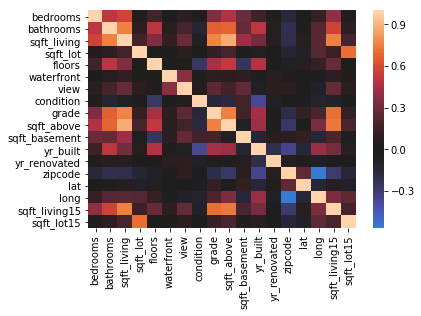

In [24]:
#Display heatmap 
sns.heatmap(df_pred.corr(), center=0)

You can adjust the color settings for clarity but personally I find it easier to create a boolean matrix with that provides True for values over your desired threshold. I will be using 0.75 correlation (correlation is between -1 and 1).

In [25]:
#Display correlation matrix
df_pred.corr()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
bedrooms,1.000000,0.514508,0.578212,0.032471,0.177944,-0.002127,0.078354,0.026496,0.356563,0.479386,0.297229,0.155670,0.017900,-0.154092,-0.009951,0.132054,0.393406,0.030690
bathrooms,0.514508,1.000000,0.755758,0.088373,0.502582,0.063629,0.186016,-0.126479,0.665838,0.686668,0.278485,0.507173,0.047177,-0.204786,0.024280,0.224903,0.569884,0.088303
sqft_living,0.578212,0.755758,1.000000,0.173453,0.353953,0.104637,0.281715,-0.059445,0.762779,0.876448,0.428660,0.318152,0.051060,-0.199802,0.052155,0.241214,0.756402,0.184342
sqft_lot,0.032471,0.088373,0.173453,1.000000,-0.004814,0.021459,0.075054,-0.008830,0.114731,0.184139,0.015031,0.052946,0.004979,-0.129586,-0.085514,0.230227,0.144763,0.718204
floors,0.177944,0.502582,0.353953,-0.004814,1.000000,0.020797,0.028414,-0.264075,0.458794,0.523989,-0.241866,0.489193,0.003793,-0.059541,0.049239,0.125943,0.280102,-0.010722
waterfront,-0.002127,0.063629,0.104637,0.021459,0.020797,1.000000,0.380543,0.016648,0.082818,0.071778,0.083050,-0.024487,0.073939,0.028923,-0.012157,-0.037628,0.083823,0.030658
view,0.078354,0.186016,0.281715,0.075054,0.028414,0.380543,1.000000,0.045622,0.249082,0.166017,0.270629,-0.054452,0.090339,0.085059,0.006321,-0.077702,0.278928,0.073083
condition,0.026496,-0.126479,-0.059445,-0.008830,-0.264075,0.016648,0.045622,1.000000,-0.146896,-0.158904,0.168482,-0.361592,-0.055808,0.002888,-0.015102,-0.105877,-0.093072,-0.003126
grade,0.356563,0.665838,0.762779,0.114731,0.458794,0.082818,0.249082,-0.146896,1.000000,0.756073,0.165843,0.447865,0.015623,-0.185771,0.113575,0.200341,0.713867,0.120981
sqft_above,0.479386,0.686668,0.876448,0.184139,0.523989,0.071778,0.166017,-0.158904,0.756073,1.000000,-0.051175,0.424037,0.020645,-0.261570,-0.001199,0.344842,0.731767,0.195077


In [26]:
#Correlation matrix showing boolean values with a threshold of 0.75
abs(df_pred.corr()) > 0.75

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
bedrooms,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
sqft_living,False,True,True,False,False,False,False,False,True,True,False,False,False,False,False,False,True,False
sqft_lot,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
floors,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
waterfront,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
view,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
condition,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
grade,False,False,True,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False
sqft_above,False,False,True,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False


It appears that 'sqft_living' has a high correlation with 'bathrooms', 'grade', 'sqft_above', and 'sqft_living15'. Therefore, I believe 'sqft_living' is the most significant of these predictor variables when selecting a house so I chose to drop the other four variables. 

In [27]:
#Drop 'grade', 'bathrooms', 'sqft_living15', 'sqft_above'
df = df.drop(['grade', 'bathrooms', 'sqft_living15', 'sqft_above'], axis = 1)
df.head()

,price,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_lot15
0,221900.0,3,1180,5650,1.0,0.0,0.0,3,0.0,1955,0.0,98178,47.5112,-122.257,5650
1,538000.0,3,2570,7242,2.0,0.0,0.0,3,400.0,1951,1991.0,98125,47.7210,-122.319,7639
2,180000.0,2,770,10000,1.0,0.0,0.0,3,0.0,1933,0.0,98028,47.7379,-122.233,8062
3,604000.0,4,1960,5000,1.0,0.0,0.0,5,910.0,1965,0.0,98136,47.5208,-122.393,5000
4,510000.0,3,1680,8080,1.0,0.0,0.0,3,0.0,1987,0.0,98074,47.6168,-122.045,7503


## Part 3: Explore

#### 3.1: Questions

When exploring the data I wanted to put myself in the mindset of a potential house buyer. When reviewing over the available variables, I find the most important factors a home buyer looks at are the location of the house, the condition of the house, and the size of the house. 

#### 3.1.1: How does the location affect the price of a house in King County? Do waterfront homes cost more? (We assume they will but maybe there are some suprises) Which zipcodes are the most expensive and which are the least? (See which neighborhoods are of better quality and see an idea of rural to urban pricing) 

In [28]:
#Create subset dataframe of 'waterfront' displaying the mean values
df.groupby(['waterfront']).mean()

,price,bedrooms,sqft_living,sqft_lot,floors,view,condition,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_lot15
waterfront,,,,,,,,,,,,,,
0.0,5.322862e+05,3.373363,2072.396485,15026.095846,1.493170,0.209174,3.408932,282.703184,1971.059018,66.537644,98077.824157,47.560232,-122.213546,12689.299753
1.0,1.717215e+06,3.349315,3244.753425,25870.883562,1.630137,3.760274,3.541096,728.458904,1962.280822,395.013699,98096.712329,47.539677,-122.278164,22893.698630


I find this to be an interesting dataframe to look at. Here we can see that the mean price of waterfront to non-waterfront properties is significant (1,717,215 to 532,286). What I find intriguing is how bedrooms, floors, and condition don't vary much between the two. The only other subsantial variable is 'sqft_living' which does have a variation but we will review that further in a later question.

This data suggests to me that the only factor affecting the difference in price is the fact that it is on the water which raises the property value. Let's look into this more deeply and confirm with a correlation between the two variables.

In [29]:
#See description of houses on the water
waterfront = df[df['waterfront'] == 1.0]
waterfront.describe()

,price,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_lot15
count,1.460000e+02,146.000000,146.000000,146.000000,146.000000,146.0,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000
mean,1.717215e+06,3.349315,3244.753425,25870.883562,1.630137,1.0,3.760274,3.541096,728.458904,1962.280822,395.013699,98096.712329,47.539677,-122.278164,22893.698630
std,1.145385e+06,1.099169,1652.134956,44629.075899,0.547895,0.0,0.635770,0.743957,808.010866,27.118576,796.174006,60.599756,0.113744,0.123772,23264.085993
min,2.850000e+05,1.000000,440.000000,1989.000000,1.000000,1.0,0.000000,1.000000,0.000000,1905.000000,0.000000,98004.000000,47.327600,-122.514000,3230.000000
25%,8.275000e+05,3.000000,2082.500000,11692.250000,1.000000,1.0,4.000000,3.000000,0.000000,1941.250000,0.000000,98040.000000,47.452550,-122.376000,11991.500000
50%,1.510000e+06,3.000000,2900.000000,17730.500000,2.000000,1.0,4.000000,3.000000,535.000000,1959.500000,0.000000,98075.000000,47.548150,-122.273500,16260.500000
75%,2.282500e+06,4.000000,4117.500000,26692.500000,2.000000,1.0,4.000000,4.000000,1265.000000,1984.750000,0.000000,98155.000000,47.607550,-122.210000,24537.500000
max,7.060000e+06,6.000000,10040.000000,505166.000000,3.000000,1.0,4.000000,5.000000,4820.000000,2014.000000,2009.000000,98199.000000,47.772900,-122.059000,192268.000000


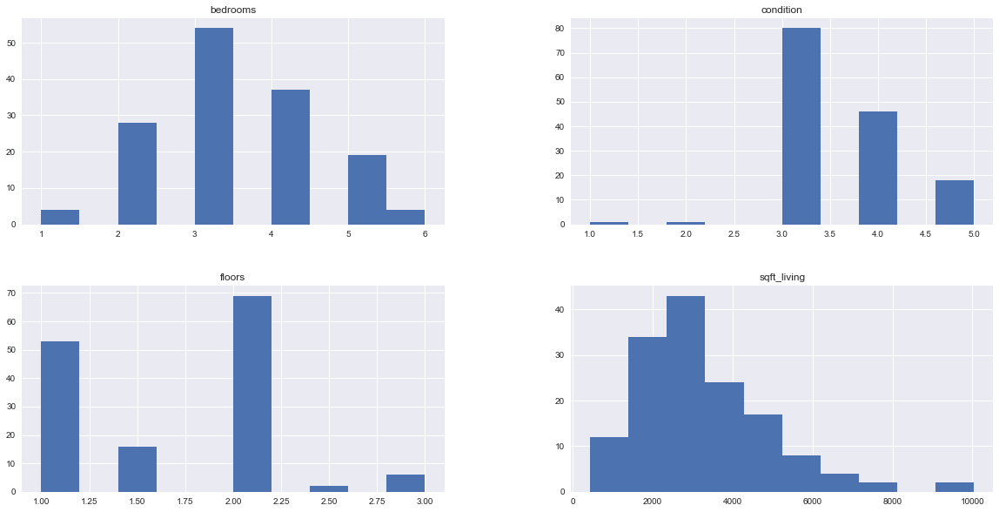

In [30]:
#Histograms of waterfront homes with 'sqft_living', 'bedrooms', 'floors', and 'condition'
plt.style.use('seaborn')
waterfront[['sqft_living','bedrooms', 'floors', 'condition']].hist(figsize = (20, 10))
plt.show()

In [31]:
#See description of houses not on the water
non_waterfront = df[df['waterfront'] == 0.0]
non_waterfront.describe()

,price,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_lot15
count,2.145100e+04,21451.000000,21451.000000,2.145100e+04,21451.000000,21451.0,21451.000000,21451.000000,21451.000000,21451.000000,21451.000000,21451.000000,21451.000000,21451.000000,21451.000000
mean,5.322862e+05,3.373363,2072.396485,1.502610e+04,1.493170,0.0,0.209174,3.408932,282.703184,1971.059018,66.537644,98077.824157,47.560232,-122.213546,12689.299753
std,3.428082e+05,0.925040,906.042446,4.138140e+04,0.539522,0.0,0.707615,0.649793,434.742944,29.381720,358.344569,53.440658,0.138697,0.140734,27287.285949
min,7.800000e+04,1.000000,370.000000,5.200000e+02,1.000000,0.0,0.000000,1.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,651.000000
25%,3.200000e+05,3.000000,1420.000000,5.035000e+03,1.000000,0.0,0.000000,3.000000,0.000000,1952.000000,0.000000,98033.000000,47.471300,-122.328000,5100.000000
50%,4.500000e+05,3.000000,1910.000000,7.590000e+03,1.500000,0.0,0.000000,3.000000,0.000000,1975.000000,0.000000,98065.000000,47.572000,-122.229000,7601.000000
75%,6.400000e+05,4.000000,2540.000000,1.057850e+04,2.000000,0.0,0.000000,4.000000,540.000000,1997.000000,0.000000,98117.000000,47.678200,-122.125000,10025.500000
max,7.700000e+06,33.000000,13540.000000,1.651359e+06,3.500000,0.0,4.000000,5.000000,4130.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,871200.000000


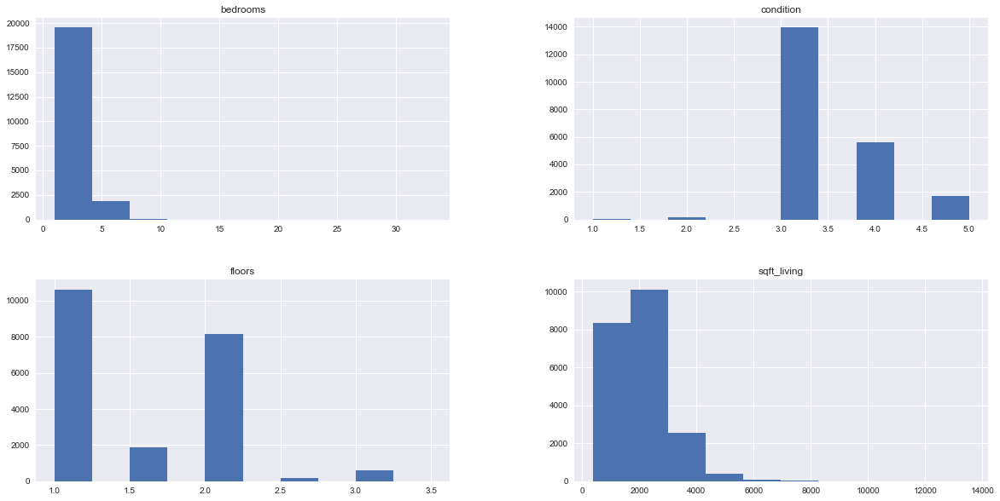

In [32]:
#Histograms of non-waterfront homes with 'sqft_living', 'bedrooms', 'floors', and 'condition'
plt.style.use('seaborn')
non_waterfront[['sqft_living','bedrooms', 'floors', 'condition']].hist(figsize = (20, 10))
plt.show()

After further evaluation of our descriptive stastics we can see that bedrooms, floors, and condition actually do vary more than we anticipated. We can see through the histograms that the amount of bedrooms and floors from waterfront to non-waterfront is much different which adds to the overall mean difference in price. But condition still seems to be similar between the two which makes me come to the conclusion that waterfront houses just tend to be a little larger in size, as we can see with 'sqft_living'.

Additionally, if you look at the top 75% for non-waterfront(640,000) and the bottom 25% for waterfront(827,500) there is still a significant difference in price further adding to our conclusion. 

Text(0.5, 1.0, 'price vs waterfront')

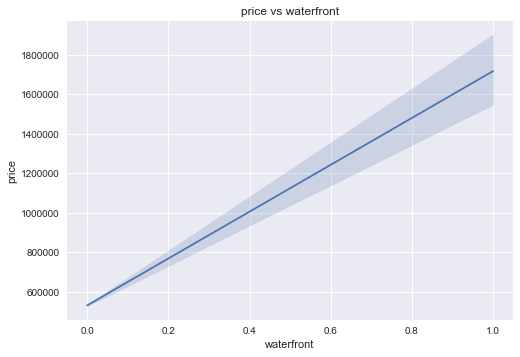

In [33]:
#Linear relationship with 'price' and 'waterfront'
sns.lineplot(df.waterfront, df.price)
plt.title('price vs waterfront')

From a contrarion view some would say the waterfront criteria is hard to truly determine for the dataset because of the extreme difference between the amount of non-waterfront homes to waterfront homes. (Shown below)

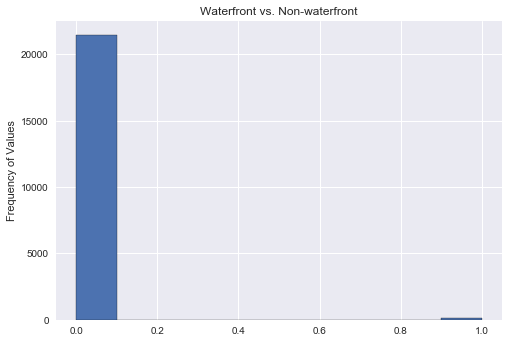

In [34]:
#Histogram of waterfront vs. non-waterfront
plt.hist(df['waterfront'], edgecolor='black')
plt.ylabel('Frequency of Values')
plt.title('Waterfront vs. Non-waterfront')
plt.show()

But I would argue that point because for the majority of counties in the US there will always be a lot more houses on the water than not on the water. 

To conclude, Houses on the water in King County tend to be larger and more expensive than houses not on the water. But the condition between the two does not seem to be dramatically different. So if you are interested in buying a home with the interest of fixing it up and flipping it, a waterfront home could be a good place to find the most profit. 

Which zipcodes are the most expensive and which are the least? (Gives an idea of which neighborhoods and general areas cost)

In [35]:
#creating an descending subset of means between 'price' and 'zipcode' by slicing for top 5 rows
#and bottom 5 rows
zip_price = df.loc[:, ['price', 'zipcode']]
zip_price1 = zip_price.groupby('zipcode').mean()
display(zip_price1.sort_values(['price'], axis = 0, ascending = False).head())
zip_price1.sort_values(['price'],axis = 0, ascending = False).tail()

,price
zipcode,
98039,2.161300e+06
98004,1.356524e+06
98040,1.194874e+06
98112,1.096239e+06
98102,8.996077e+05


,price
zipcode,
98148,284908.596491
98001,281194.869806
98032,251296.240000
98168,240328.371747
98002,234284.035176


I am going to create a heat map first that will show the density of houses in king county and then create another heat map that will show the average price across these zipcodes.

In [36]:
#create a new dataframe for 'zipcode', finding the mean of each column, and resetting the index 
df_zipcode = df.groupby('zipcode').aggregate(np.mean)
df_zipcode.reset_index(inplace = True)

In [37]:
#Finding the number of houses per zipcode
df['count'] = 1
df_count_zip = df.groupby('zipcode').sum()
#Creating a dataframe for just 'zipcode' and 'count'
df_count_zip.reset_index(inplace=True)
df_count_zip = df_count_zip[['zipcode','count']]
df_zipcode = pd.merge(df_zipcode, df_count_zip, on='zipcode')
#Drop 'count' from original dataframe
df.drop(['count'], axis=1, inplace=True)
df_zipcode.head()

,zipcode,price,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_basement,yr_built,yr_renovated,lat,long,sqft_lot15,count
0,98001,2.811949e+05,3.393352,1903.783934,14967.002770,1.430748,0.000000,0.094183,3.335180,180.027701,1980.867036,22.058172,47.309106,-122.270704,11218.875346,361
1,98002,2.342840e+05,3.326633,1627.743719,7517.633166,1.334171,0.000000,0.010050,3.743719,105.206030,1967.773869,49.924623,47.308780,-122.213357,7585.482412,199
2,98003,2.941113e+05,3.357143,1928.882143,10603.096429,1.310714,0.000000,0.214286,3.371429,259.117857,1976.885714,14.264286,47.315741,-122.310054,9746.178571,280
3,98004,1.356524e+06,3.854890,2909.022082,13104.220820,1.432177,0.003155,0.305994,3.495268,489.179811,1971.470032,176.671924,47.616183,-122.205189,12805.022082,317
4,98005,8.102897e+05,3.851190,2656.803571,19928.785714,1.279762,0.000000,0.095238,3.696429,485.952381,1969.744048,47.630952,47.611532,-122.167268,18367.773810,168


In [38]:
#Loading in my geographical file
import json
f = open('Zipcodes_for_King_County_and_Surrounding_Area__zipcode_area.geojson')
zip_geo_map = json.load(f)

In [71]:
#display data type
type(zip_geo_map)

dict

In [40]:
#show data keys
zip_geo_map.keys()

dict_keys(['type', 'crs', 'features'])

In [41]:
#looking at our key 'type'
zip_geo_map['type']

'FeatureCollection'

In [75]:
#See first entry for 'features'
zip_geo_map['features'][0]

{'type': 'Feature',
 'properties': {'Name': None,
  'description': None,
  'OBJECTID': 1,
  'ZIP': 98031,
  'ZIPCODE': '98031',
  'COUNTY': '033',
  'ZIP_TYPE': 'Standard',
  'Shape_Length': 117508.232812751,
  'Shape_Area': 228012907.118483},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-122.21842289814009, 47.43750364721223],
    [-122.21896085950958, 47.43750323429727],
    [-122.21957512255675, 47.437502747190244],
    [-122.22159770557352, 47.43750114909897],
    [-122.22159948012721, 47.43495688707408],
    [-122.22170516190663, 47.43495715623222],
    [-122.22360892956898, 47.43496199332689],
    [-122.2237345700619, 47.434962098174005],
    [-122.22587769264129, 47.434963880129295],
    [-122.22612385149931, 47.43508413470761],
    [-122.22618863017513, 47.43511744881442],
    [-122.22628847456157, 47.43516579122701],
    [-122.22628861266344, 47.43516566614359],
    [-122.22648870370672, 47.43497890628139],
    [-122.22661341968615, 47.43486319440106],
    [-122.226718

In [76]:
len(zip_geo_map['features'])

204

In [91]:
#Creating a list that only contains zipcodes that we have in our dataset. The file contains extra
#zipcodes not in our dataset
temp = zip_geo_map
finalzips=[]
for i in range(len(temp['features'])):
    if temp['features'][i]['properties']['ZIP'] in list(df_zipcode['zipcode'].unique()):
        finalzips.append(temp['features'][i])

#show finalzip code amount
display(len(finalzips))
#make seperate json        
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = finalzips
#save json
open("final_geodata.json", "w").write(json.dumps(new_json, sort_keys = True, indent=4, separators=(',',':')))

74

11782825

In [92]:
#cleaned geographical data
king_geo_map = "final_geodata.json"
#Using means of lat and long to create a Folium Map
folium_map = folium.Map(location=[df['lat'].mean(), df['long'].mean()], 
            zoom_start=9, detect_retina=True, control_scale=False)
#Creating a Choropleth Map
folium.Choropleth(geo_data=king_geo_map,data=df_zipcode,
                  columns=['zipcode','price'],
                  key_on='feature.properties.ZIP',
                  fill_color='OrRd',
                  fill_opacity=0.9,
                  line_opacity=0.2,
                  legend_name='Relationship of Zipcode vs. Price').add_to(folium_map)

folium.LayerControl().add_to(folium_map)
#Save as an html
folium_map.save('zipcode_price.html')
#display map
folium_map

As we can see from our map, our most expensive zipcode, 98039, is located in downtown Seattle. Additionally, the next three most expensive zipcodes are touching this zipcode and are also close to downtown. As you start to move farther from downtown, you can see the price starts to decrease. Also, if you look at the zipcodes touching the water, they are slightly more expensive but not by a lot. The reason is because the waterfront homes are bringing up the average. Overall, as one might expect, downtown Seattle will cost more than rural parts of King County. 

In [93]:
##House density
king_geo_map = "final_geodata.json"

folium_map = folium.Map(location=[df['lat'].mean(), df['long'].mean()], 
            zoom_start=9, detect_retina=True, control_scale=False)

folium.Choropleth(geo_data=king_geo_map,data=df_zipcode,
                  columns=['zipcode','count'],
                  key_on='feature.properties.ZIP',
                  fill_color='BuGn',
                  fill_opacity=0.9,
                  line_opacity=0.2,
                  legend_name='Relationship of Zipcode vs. Count').add_to(folium_map)

folium.LayerControl().add_to(folium_map)

folium_map.save('zipcode_count.html')

folium_map

The density of houses was interesting to look at after viewing price. We see the most dense areas were same zipcodes as the least expensive areas. Also, our zipcode 98039, was one of the least dense. 

#### 3.1.2: How does the condition of the house affect price? 

Text(0.5, 1.0, 'price vs condition')

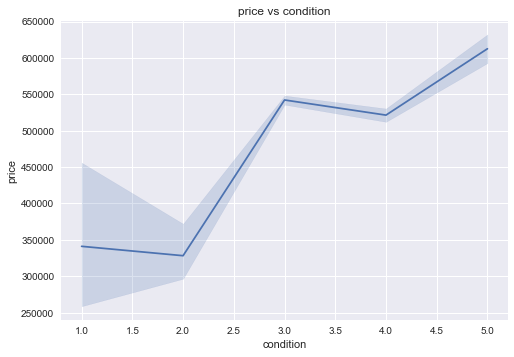

In [95]:
#Linear relationship between 'price' and 'condition'
sns.lineplot(df.condition, df.price)
plt.title('price vs condition')

If we look at the linear relationship between price and condition, overall, we see the better the condition the house, the higher the price. Oddly, you would assume that the price would increase with each increase in condition but from condition 1 to 2 and 3 to 4, there seems to be a decrease in average price. Let's investigate this further. 

In [96]:
#creating an descending subset of means between 'price' and 'condition' by slicing 
cond_price = df.loc[:, ['price', 'condition']]
cond_price1 = cond_price.groupby('condition').mean()
cond_price1

,price
condition,
1,341067.241379
2,328178.758824
3,542173.057347
4,521374.450414
5,612577.742504


(array([0, 1, 2, 3, 4]), <a list of 5 Text xticklabel objects>)

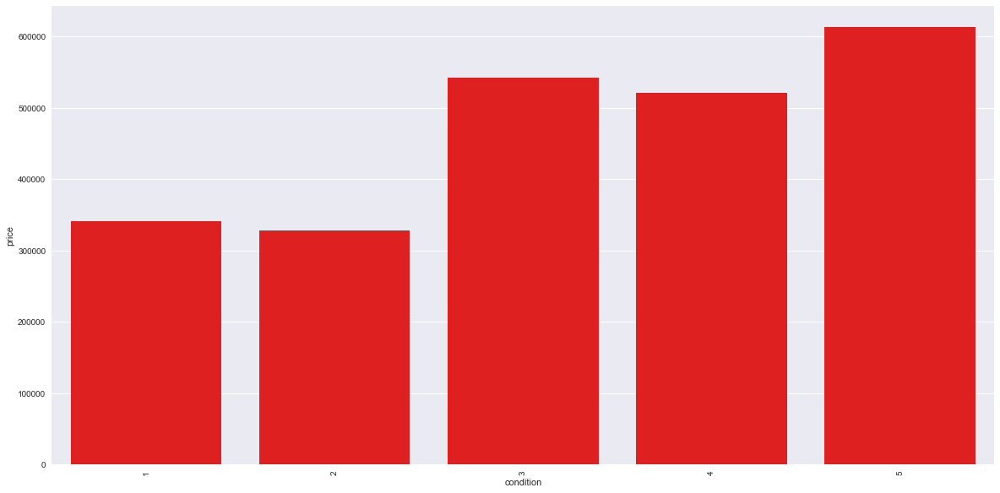

In [97]:
#Bar graph of the relationship between 'price' and 'condition'
f, ax = plt.subplots(figsize = (20, 10))
sns.barplot(df['condition'], df['price'], ci = False, color = 'red')
plt.xticks(rotation = 90)

Let's see if maybe the drop between conditions is due to the overall size of these houses. 

,sqft_living
condition,
1,1247.931034
2,1420.823529
3,2149.205492
4,1951.408843
5,2022.911229


Text(0.5, 1.0, 'sqft_living vs condition')

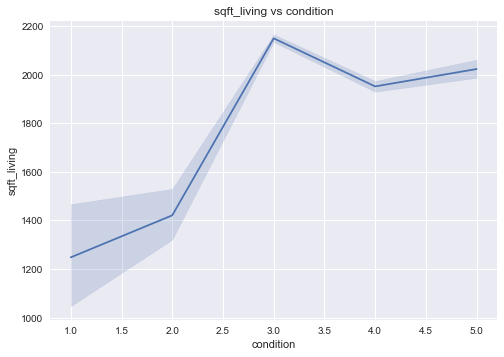

In [98]:
#creating an descending subset of means between 'sqft_living' and 'condition' by slicing
cond_sqft = df.loc[:, ['sqft_living', 'condition']]
cond_sqft1 = cond_sqft.groupby('condition').mean()
display(cond_sqft1)
#Linear relationship between 'condition' and 'sqft_living'
sns.lineplot(df.condition, df.sqft_living)
plt.title('sqft_living vs condition')



As we can see, the size of the house between conditions was not the reason for a lower price and condition 3 had the most 'sqft-living' on average. Let's look further to see if maybe the year the house was built and renovated shows any explanation for the difference between conditions. 

In [99]:
#creating an descending subset of means between 'condition', 'yr_renovated', and 'price' by slicing
cond_yr_price = df.loc[:, ['price', 'condition', 'yr_renovated']]
cond_yr_price1 = cond_yr_price.groupby(['condition', 'yr_renovated'])['price'].mean()
cond_yr_price1

condition  yr_renovated
1          0.0             3.442482e+05
           1992.0          2.520000e+05
2          0.0             3.281460e+05
           1960.0          1.600000e+05
           1968.0          2.500000e+05
           1996.0          5.800000e+05
3          0.0             5.320902e+05
           1940.0          3.133000e+05
           1945.0          3.155000e+05
           1946.0          5.500000e+05
           1948.0          4.100000e+05
           1951.0          2.760000e+05
           1953.0          2.475000e+05
           1954.0          9.000000e+05
           1955.0          3.775000e+05
           1956.0          1.160000e+06
           1958.0          8.686900e+05
           1959.0          3.975000e+05
           1960.0          2.037000e+05
           1962.0          4.250000e+05
           1963.0          3.754250e+05
           1964.0          2.635500e+05
           1965.0          6.235000e+05
           1968.0          3.839000e+05
           1969.

In [100]:
#creating an descending subset of means between 'condition', 'yr_built', and 'price' by slicing
cond_built_price = df.loc[:, ['price', 'condition', 'yr_built']]
cond_built_price1 = cond_built_price.groupby(['condition', 'yr_built'])['price'].mean()
cond_built_price1

condition  yr_built
1          1900        3.927250e+05
           1901        4.270000e+05
           1908        1.300000e+05
           1910        2.310000e+05
           1916        1.250000e+05
           1918        4.010000e+05
           1919        4.410000e+05
           1924        2.950000e+05
           1926        4.815000e+05
           1928        2.050000e+05
           1932        2.752500e+05
           1933        5.500000e+05
           1942        7.800000e+04
           1943        8.100000e+04
           1945        1.900000e+05
           1950        1.500000e+05
           1954        4.025000e+05
           1955        9.400000e+05
           1962        3.650000e+05
           1966        1.960000e+05
2          1900        7.675000e+05
           1903        1.675000e+05
           1905        4.625000e+05
           1906        3.060517e+05
           1908        1.800000e+05
           1910        3.700000e+05
           1911        6.195000e+05
        

As we could of assumed, the most recently a house was built and renovated, the better the condition of the house. Still, I could'nt find anything that stands out to show a trend as to why the price drops between conditions 1 to 2, and, 3 to 4. Overall, there is a linear relationship showing the higher the condition, the higher the average price. But, the inconsitencies between conditions makes me conclude that condition is not a good prediction of price. 

#### 3.1.3: What is the relationship between the size of a home and the price?

In our current dataframe (after certain features were dropped due to multicollinearity), I find the features that relate most to the size of a house to be 'sqft_living', 'sqft_lot', 'sqft_basement', sqft_lot15', and 'bedroom'. In my opinion 'sqft_living' will be the most important feature but we will check this.

First, I assume there is a positive relationship between 'bedrooms' and 'sqft_living'. I want to check this so then I can focus on just the square foot features. 

count    21597.000000
mean         3.373200
std          0.926299
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max         33.000000
Name: bedrooms, dtype: float64

Text(0.5, 1.0, 'Bedrooms vs Sqft_living')

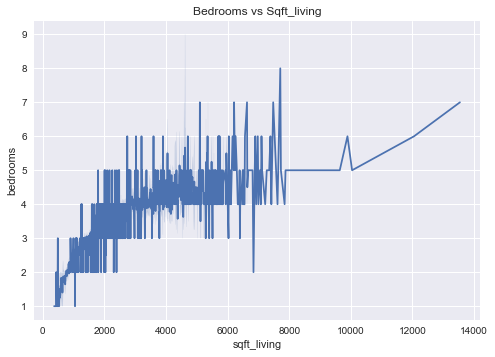

In [101]:
#Description of 'bedrooms'
display(df.bedrooms.describe())
#Linear relationship between 'sqft_living' and 'bedrooms'
sns.lineplot(df.sqft_living, df.bedrooms)
plt.title('Bedrooms vs Sqft_living')

'Bedrooms' does show a positive linear relationship with 'sqft_living' as expected. There do seem to be outliers in the bedrooms data as seen with a max of 33 but we will handle that problem later in our EDA. 

Now we can focus just on our square foot features.

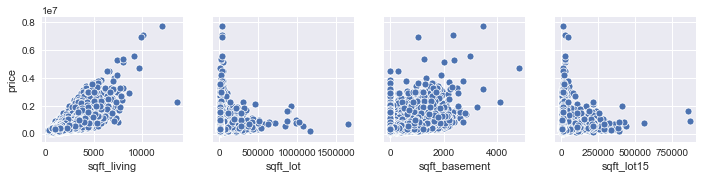

In [102]:
#Create scatterplots of the square root variables
sns.pairplot(data=df, x_vars=['sqft_living','sqft_lot','sqft_basement','sqft_lot15'], y_vars=["price"])

'sqft_living' clearly has the best relationship with price. 
'sqft_basement' has a slight relationship with price.
'sqft_lot' and 'sqft_lot15' seem to have relatively no relationship with price.

'sft_lot' and 'sqft_lot15' show large variations between size and price. For example, some points seem to have a large lot size at a small price and vis versa. The descrepencies occur due to the range of houses that are rural and urban. Urban homes will tend to have a small amount of lot space but will cost more due to its location in a metropolitan area. Rural homes will have more lot space but the prices will tend to be lower because of its location. This makes lot size by itself, a difficult estimator when predicting price. 

Let's investigate 'sqft_basement' further.

In [103]:
#Show description of 'sqft_basement' and value counts
display(df.sqft_basement.describe())
df.sqft_basement.value_counts()

count    21597.000000
mean       285.716581
std        439.819830
min          0.000000
25%          0.000000
50%          0.000000
75%        550.000000
max       4820.000000
Name: sqft_basement, dtype: float64

0.0       13280
600.0       217
500.0       209
700.0       208
800.0       201
400.0       184
1000.0      148
900.0       142
300.0       142
200.0       105
750.0       104
450.0       103
530.0       103
480.0       103
720.0        98
620.0        90
580.0        84
840.0        83
420.0        81
860.0        79
670.0        78
1100.0       78
780.0        76
550.0        76
650.0        75
240.0        74
680.0        73
380.0        73
850.0        72
360.0        72
          ...  
2600.0        1
2610.0        1
276.0         1
274.0         1
1245.0        1
143.0         1
266.0         1
862.0         1
2180.0        1
415.0         1
243.0         1
1135.0        1
1525.0        1
3000.0        1
172.0         1
225.0         1
518.0         1
935.0         1
1920.0        1
1930.0        1
1990.0        1
588.0         1
1548.0        1
2390.0        1
602.0         1
915.0         1
295.0         1
1281.0        1
2130.0        1
906.0         1
Name: sqft_basement, Len

At first glance we can already see the problem with our 'sqft_basment' feature. A majority of our houses do not even have a basement. We can conclude that 'sqft_basement' by itself is not a good estimation for future price. 

Overall, 'sqft_living' shows the best relationship with price because it tends to encompass the other features and generalize them. 

#### 3.2: Checking Assumptions before we run our model. 

The following assumptions must be checked in order to run a OLS Linear Regression: Linearity, Normality, and Homoscedasticity (Multicollinearity is also an assumption but we dealt with this issue earlier.)

#### 3.2.1: Before we check our assumptions we must first remove outliers from our dataset because they will have a negative effect on our assumption check. (We will use logic to select columns that can have outliers; i.e. zipcode is just locations so they will not have outliers)

In [104]:
#Show top 5 rows of dataframe
df.head()

,price,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_lot15
0,221900.0,3,1180,5650,1.0,0.0,0.0,3,0.0,1955,0.0,98178,47.5112,-122.257,5650
1,538000.0,3,2570,7242,2.0,0.0,0.0,3,400.0,1951,1991.0,98125,47.7210,-122.319,7639
2,180000.0,2,770,10000,1.0,0.0,0.0,3,0.0,1933,0.0,98028,47.7379,-122.233,8062
3,604000.0,4,1960,5000,1.0,0.0,0.0,5,910.0,1965,0.0,98136,47.5208,-122.393,5000
4,510000.0,3,1680,8080,1.0,0.0,0.0,3,0.0,1987,0.0,98074,47.6168,-122.045,7503


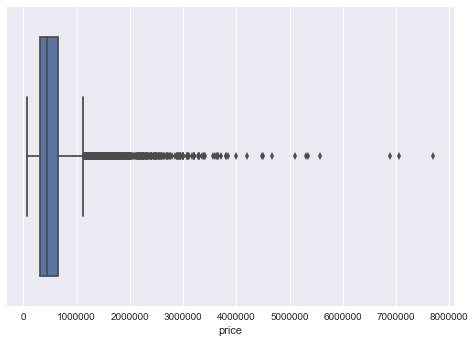

In [105]:
#Boxplot to detect outliers for 'price'
sns.boxplot(df.price)

In [106]:
#remove outliers
df = df[df.price < 4500000]
df.price.describe()

count    2.158800e+04
mean     5.381061e+05
std      3.507459e+05
min      7.800000e+04
25%      3.220000e+05
50%      4.500000e+05
75%      6.450000e+05
max      4.490000e+06
Name: price, dtype: float64

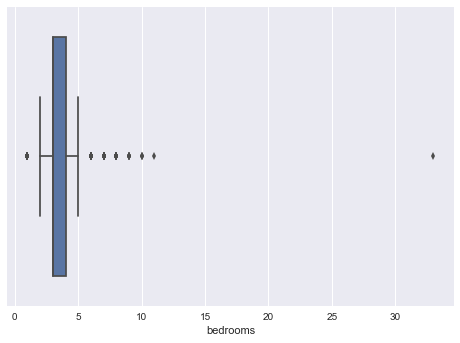

In [107]:
#Boxplot to detect outliers for 'bedrooms'
sns.boxplot(df.bedrooms)

In [108]:
#remove outliers
df = df[df.bedrooms<15]
df.bedrooms.describe()

count    21587.000000
mean         3.371010
std          0.903363
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max         11.000000
Name: bedrooms, dtype: float64

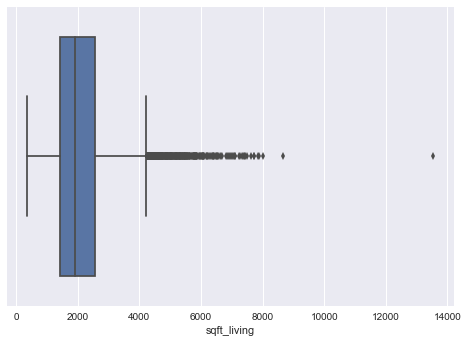

In [109]:
#Boxplot to detect outliers for 'sqft_living'
sns.boxplot(df.sqft_living)

In [110]:
#remove outliers
df = df[df.sqft_living<8000]
df.sqft_living.describe()

count    21584.000000
mean      2076.352900
std        901.545628
min        370.000000
25%       1426.500000
50%       1910.000000
75%       2550.000000
max       7880.000000
Name: sqft_living, dtype: float64

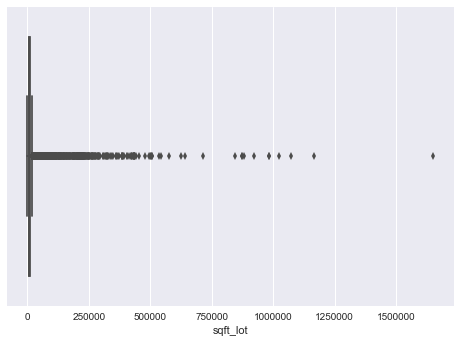

In [111]:
#Boxplot to detect outliers for 'sqft_lot'
sns.boxplot(df.sqft_lot)

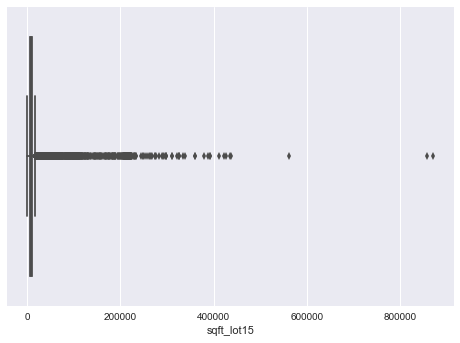

In [112]:
#Boxplot to detect outliers for 'sqft_lot15'
sns.boxplot(df.sqft_lot15)

After creating boxplots, I was able to find that 'price', 'bedrooms', 'sqft_living',  'sqft_lot', and 'sqft_lot15' all possessed outliers. I removed outliers from those features at my own discretion. Now, the features will not have as much of an effect on our distributions and model.

#### 3.2.2: Checking for Linearity, Normality, and Homoscedasticity

I am going to loop through the features and plot graphs that we can use to check all of these assumptions. I will only be looking at continuous features because we will be performing one-hot encoding on categorical variables in the next step. 

sm.graphics.plot_regress_exog(): We will use this built in visualization to check the linearity and homoscedasticity of the feature. 
    Plots four graphs: Y and Fitted vs. X, Residuals vs. Selected Feature, Partial Regression     Plot, Component and Component Plus Residual 

Q-Q plot: Will be used to check for normality

Price vs. sqft_living


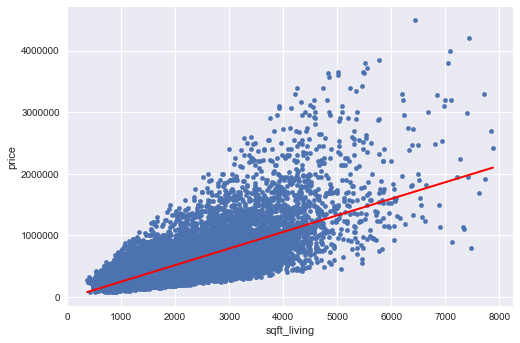

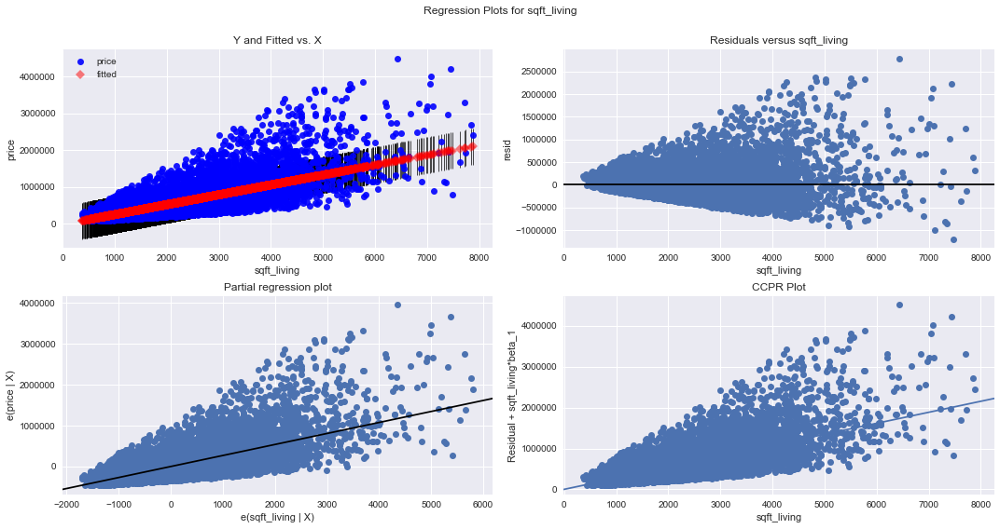

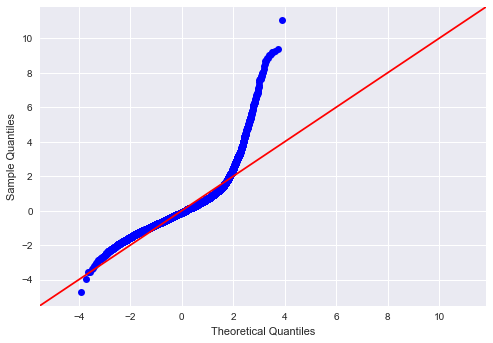

Price vs. sqft_lot


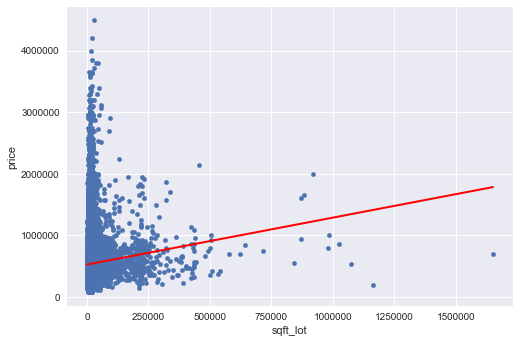

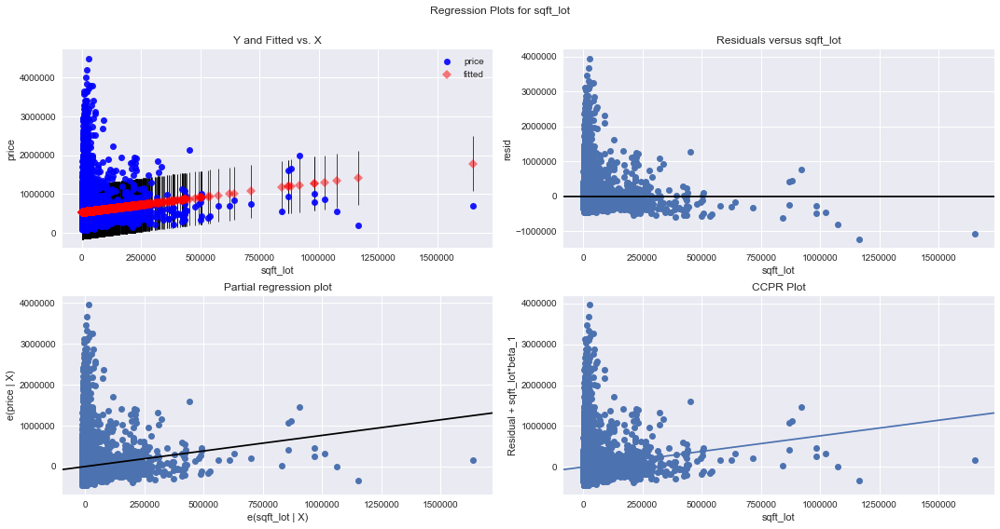

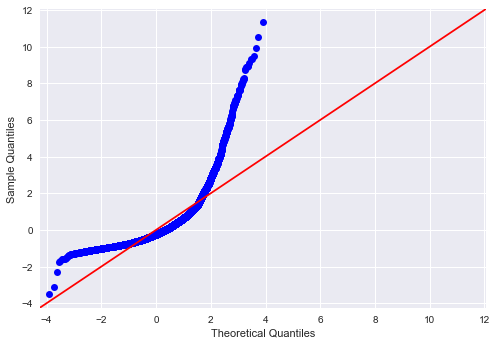

Price vs. sqft_lot15


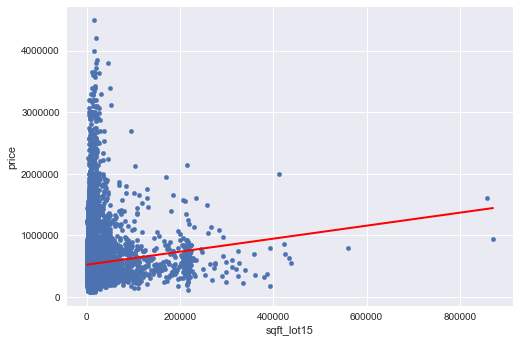

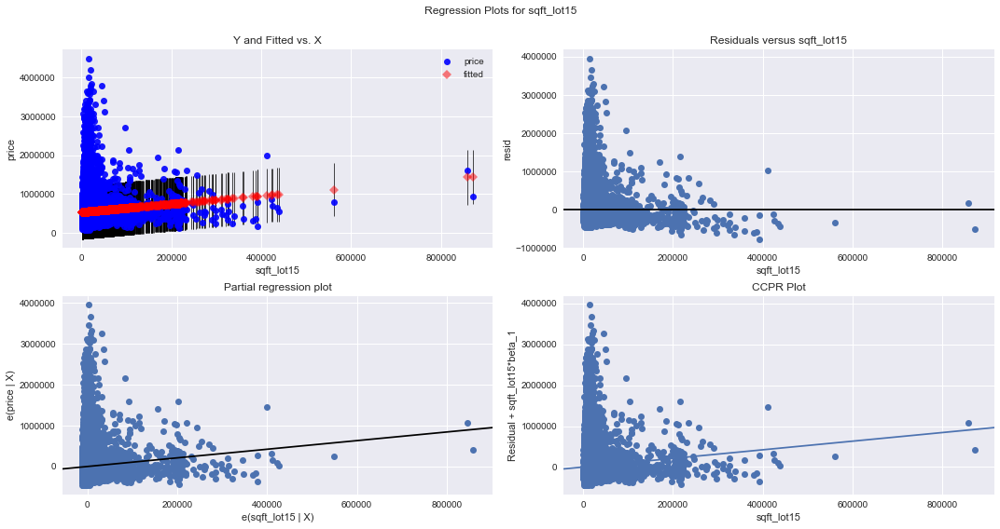

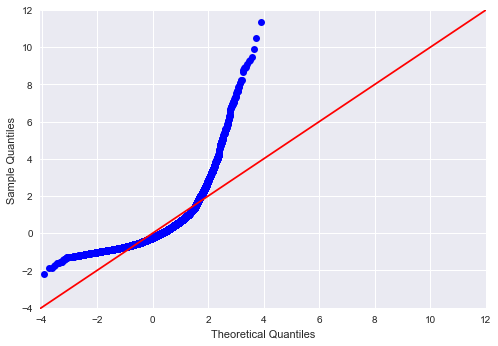

In [113]:
#enumerate through our continuous features 'sqft_living', 'sqft_lot', and 'sqft_lot15' to 
#produce regression plots that will help us check for normality, linearity, and homoscedasticity
for idx, val in enumerate([ 'sqft_living','sqft_lot','sqft_lot15']):
    print ("Price vs. " + val)
    f = 'price~' + val  
    model = smf.ols(formula=f, data=df).fit()
    X_new = pd.DataFrame({val: [df[val].min(), df[val].max()]});
    preds = model.predict(X_new)
    df.plot(kind='scatter', x=val, y='price');
    plt.plot(X_new, preds, c='red', linewidth=2);
    plt.show()
    fig = plt.figure(figsize=(15,8))
    fig = sm.graphics.plot_regress_exog(model, val, fig=fig)
    fig = sm.graphics.qqplot(model.resid, dist=stats.norm, line='45', fit=True,   )
    plt.show()
    
       

##### Price vs Sqft_living:
* Linearity- From the first two graphs, I can see there is a positive linear relationship between the two variables. 
* Homoscedasticity- Our third graph, Residuals vs. sqft_living, shows a cone like shape which means it is heteroscedastic. We will have to perform a logarithmic function on sqft_living to help fix this problem.
* Normality- Our Q-Q plot shows it is not normally distributed giving us another reason to perform a logarithmic function. 
(We will be performing log functions on features in the next step)

##### Price vs Sqft_lot:
* Linearity- From the first two graphs, I can see there is not a solid relationship between the two variables
* Homoscedasticity- Our third graph, also shows it is heteroscedastic so we will perform a logarithmic function on this variable.
* Normality- Our Q-Q plot shows it is not normally distributed giving us another reason to perform a logarithmic function.

##### Price vs Sqft_lot15:
* Linearity- From the first two graphs, I can see there is not a solid relationship between the two variables
* Homoscedasticity- Our third graph, also shows it is heteroscedastic so we will perform a logarithmic function on this variable.
* Normality- Our Q-Q plot shows it is not normally distributed giving us another reason to perform a logarithmic function.

#### 3.2.3: Normalizing and scaling features.

We will begin by performing logarithmic functions on said features from above. This will help normalize our features and help in checking our assumptions. After that I will scale the features so no variables out weigh the others in our model. 

In [114]:
# log function to normalize
sqft_living = np.log(df.sqft_living)
sqft_lot = np.log(df.sqft_lot)
sqft_lot15 = np.log(df.sqft_lot15)
price = np.log(df.price)

# scale features
df['sqft_living'] = ( sqft_living - min(sqft_living) ) / ( max(sqft_living) - min(sqft_living) )
df['sqft_lot'] = ( sqft_lot - min(sqft_lot) ) / ( max(sqft_lot) - min(sqft_lot) )
df['sqft_lot15'] = ( sqft_lot15 - min(sqft_lot15) ) / ( max(sqft_lot15) - min(sqft_lot15) )
df['price'] = ( price - min(price) ) / ( max(price) - min(price) )



#### 3.3: Dealing with categorical features

In our data, we have already seen there are features that represent a location/category. In order to use this data for our regression model, we must perform one-hot encoding on the data to turn the features into dummy variables. Otherwise, the results of our model will be inaccurate. 

Identify categorical features: We have already seen some categorical variables but lets plot all of the features and confirm. 

In [115]:
#See top 5 rows in the dataframe
df.head()

,price,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_lot15
0,0.257968,3,0.379185,0.295858,1.0,0.0,0.0,3,0.0,1955,0.0,98178,47.5112,-122.257,0.300162
1,0.476486,3,0.633679,0.326644,2.0,0.0,0.0,3,400.0,1951,1991.0,98125,47.7210,-122.319,0.342058
2,0.206333,2,0.239617,0.366664,1.0,0.0,0.0,3,0.0,1933,0.0,98028,47.7379,-122.233,0.349544
3,0.505037,4,0.545088,0.280700,1.0,0.0,0.0,5,910.0,1965,0.0,98136,47.5208,-122.393,0.283185
4,0.463298,3,0.494689,0.340224,1.0,0.0,0.0,3,0.0,1987,0.0,98074,47.6168,-122.045,0.339562


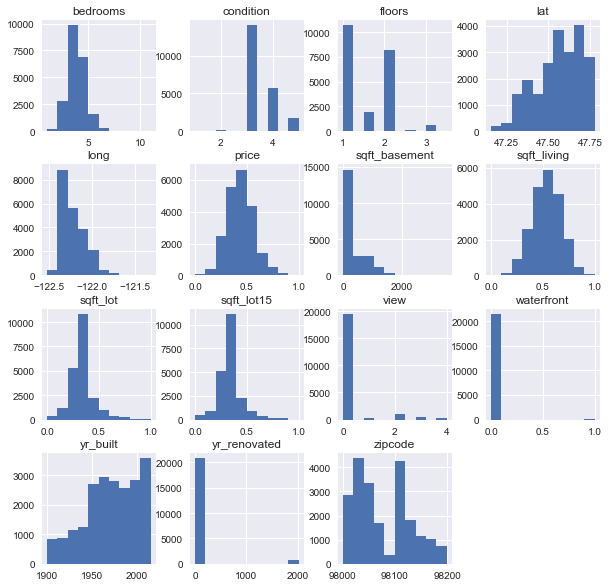

In [116]:
#Create histograms for our remaining features
import warnings
warnings.filterwarnings('ignore')
fig = plt.figure(figsize = (10,10))
ax = fig.gca()
df.hist(ax = ax);

Now, we can see which are our categorical features so we can perform one-hot encoding: 'waterfront', 'bedrooms', 'floors', 'view', 'yr_renovated'.

First, let's turn these into categorical datatypes and then we will create dummy variables out of them. Additionally, I want to bin features in order to create categories that are more simplistic and easier to analyze. 

In [117]:
#We want to simplify view into viewed(1) and not viewed(0)
df['view'] = (df['view'] > 0).astype('uint8')

In [118]:
#Binning lat and long to make things simpilar. Then performing one-hot encoding on lat and long.
bins = list(np.linspace(df.long.min(), df.long.max(), num=10))
labels = [i for i in range(1,10)]
df.lat = pd.cut(df.lat, bins, labels=labels)
df.lat = df.lat.astype('category')
lat = pd.get_dummies(df.lat,prefix='lat', drop_first=True)
df.long = pd.cut(df.long, bins, labels=labels)
df.long = df.long.astype('category')
long = pd.get_dummies(df.long,prefix='long', drop_first=True)
#join dummy variables into dataset and drop original features
df = df.join([lat, long])
df.drop(['lat','long'], axis=1, inplace=True)

In [119]:
#Binning yr_built into 10 segments (decades). Create dummy variables and join to dataframe
bins = list(np.linspace(df.yr_built.min(),df.yr_built.max(),num=10))
labels = [i for i in range(1,10)]
df.yr_built = pd.cut(df.yr_built, bins, labels=labels)
df.yr_built = df.yr_built.astype('category')
yr_built = pd.get_dummies(df.yr_built,prefix='yr_built', drop_first=True)
df = df.join([yr_built])
df.drop(['yr_built'], axis=1, inplace=True)

In [120]:
#Bin 'sqft_basement' into having a basement(1) and not having a basement(0)
#join dummy variables into dataset and drop original features
bins = [ -1 , 1 , df.sqft_basement.max() ]
labels = ['0','1']
df.sqft_basement = pd.cut(df.sqft_basement, bins, labels=labels)
df.sqft_basement = df.sqft_basement.astype('category')
sqft_basement = pd.get_dummies(df.sqft_basement, prefix='basement', drop_first=True)
df = df.join([sqft_basement])
df.drop(['sqft_basement'], axis=1, inplace=True)

In [121]:
#Bin 'yr_renovated' into renovated(1) and not being renovated(0)
#join dummy variables into dataset and drop original features
bins = [ -1 , 1 , df.yr_renovated.max() ]
labels = ['0','1']
df.yr_renovated = pd.cut(df.yr_renovated, bins, labels=labels)
df.yr_renovated = df.yr_renovated.astype('category')
yr_renovated = pd.get_dummies(df.yr_renovated, prefix='renovated', drop_first=True)
df = df.join([yr_renovated])
df.drop(['yr_renovated'], axis=1, inplace=True)

In [122]:
df.info()
df_copy = df.copy()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21584 entries, 0 to 21596
Data columns (total 36 columns):
price          21584 non-null float64
bedrooms       21584 non-null int64
sqft_living    21584 non-null float64
sqft_lot       21584 non-null float64
floors         21584 non-null float64
waterfront     21584 non-null float64
view           21584 non-null uint8
condition      21584 non-null int64
zipcode        21584 non-null int64
sqft_lot15     21584 non-null float64
lat_2          21584 non-null uint8
lat_3          21584 non-null uint8
lat_4          21584 non-null uint8
lat_5          21584 non-null uint8
lat_6          21584 non-null uint8
lat_7          21584 non-null uint8
lat_8          21584 non-null uint8
lat_9          21584 non-null uint8
long_2         21584 non-null uint8
long_3         21584 non-null uint8
long_4         21584 non-null uint8
long_5         21584 non-null uint8
long_6         21584 non-null uint8
long_7         21584 non-null uint8
long_8         

In [123]:
#Changing to categorical datatypes
df.zipcode = df.zipcode.astype('category')
df.bedrooms = df.bedrooms.astype('category')
df.floors = df.floors.astype('category')
df.view = df.view.astype('category')
df.waterfront = df.waterfront.astype('category')
df.condition = df.condition.astype('category')

In [124]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21584 entries, 0 to 21596
Data columns (total 36 columns):
price          21584 non-null float64
bedrooms       21584 non-null category
sqft_living    21584 non-null float64
sqft_lot       21584 non-null float64
floors         21584 non-null category
waterfront     21584 non-null category
view           21584 non-null category
condition      21584 non-null category
zipcode        21584 non-null category
sqft_lot15     21584 non-null float64
lat_2          21584 non-null uint8
lat_3          21584 non-null uint8
lat_4          21584 non-null uint8
lat_5          21584 non-null uint8
lat_6          21584 non-null uint8
lat_7          21584 non-null uint8
lat_8          21584 non-null uint8
lat_9          21584 non-null uint8
long_2         21584 non-null uint8
long_3         21584 non-null uint8
long_4         21584 non-null uint8
long_5         21584 non-null uint8
long_6         21584 non-null uint8
long_7         21584 non-null uint8
l

In [125]:
#create dummy variables
zipcode = pd.get_dummies(df.zipcode, prefix='zipcode', drop_first=True)
bedrooms = pd.get_dummies(df.bedrooms, prefix='bedrooms', drop_first=True)
floors = pd.get_dummies(df.floors, prefix='floors', drop_first=True)
view = pd.get_dummies(df.view, prefix='view', drop_first=True)
waterfront = pd.get_dummies(df.waterfront, prefix='waterfront', drop_first=True)
condition = pd.get_dummies(df.condition, prefix='condition', drop_first=True)

Now, we need to remove the original features and then add our dummy variables to the dataset.

In [126]:
#join dummy variables into dataset
df = df.join([bedrooms, floors, view, waterfront, condition, zipcode])
#drop original features
df.drop(['waterfront','view', 'bedrooms', 'floors', 'condition', 'zipcode'], axis=1, inplace=True)

In [127]:
df.head()

,price,sqft_living,sqft_lot,sqft_lot15,lat_2,lat_3,lat_4,lat_5,lat_6,lat_7,...,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,0.257968,0.379185,0.295858,0.300162,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,0.476486,0.633679,0.326644,0.342058,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0.206333,0.239617,0.366664,0.349544,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.505037,0.545088,0.280700,0.283185,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0.463298,0.494689,0.340224,0.339562,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Everything looks in order! We have now dealt with our categorical variables!

## Part 4: Model

Our first step will be to model our remaining dataframe. After our initial model, we will assess said model and then perform stepwise selection to find which predictors are best for our final model. I will then validate the model by splitting the data into training sets and test sets and compare RMSE. Then, if need be, we will perform cross validation. 

#### 4.1: Initial model

In [128]:
#Run a MLR regression
predictors = df.drop('price', axis=1)
predictors_int = sm.add_constant(predictors)
model = sm.OLS(df['price'],predictors_int).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.863
Model:                            OLS   Adj. R-squared:                  0.862
Method:                 Least Squares   F-statistic:                     1217.
Date:                Fri, 10 Jan 2020   Prob (F-statistic):               0.00
Time:                        12:37:31   Log-Likelihood:                 34979.
No. Observations:               21584   AIC:                        -6.973e+04
Df Residuals:                   21472   BIC:                        -6.884e+04
Df Model:                         111                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.0783      0.010     -7.535      0.000      -0.099      -0.058
sqft_living        0.4893      0.005    108.136      0.000       0.480       0.498
sqft_lot           0.1705      0.008     21.736      0.000       0.155       0.186
sqft_lot15         0.0185      0.008      2.412      0.016       0.003       0.034
lat_2            7.82e-16   1.61e-16      4.855      0.000    4.66e-16     1.1e-15
lat_3          -2.919e-16   2.83e-17    -10.304      0.000   -3.47e-16   -2.36e-16
lat_4           4.695e-16   1.42e-16      3.302      0.001    1.91e-16    7.48e-16
lat_5          -2.111e-15   1.74e-16    -12.100      0.000   -2.45e-15   -1.77e-15
lat_6          -1.294e-16   7.85e-17     -1.648      0.099   -2.83e-16    2.45e-17
lat_7          -1.388e-15   1.03e-16    -13.445      0.000   -1.59e-15   -1.19e-15
lat_8           1.421e-15   1.14e-16     12.442      0.000     1.2e-15    1.65e-15
lat_9           1.383e-15   1.51e-16      9.162      0.000    1.09e-15    1.68e-15
long_2            -0.0105      0.002     -4.389      0.000      -0.015      -0.006
long_3            -0.0168      0.004     -3.970      0.000      -0.025      -0.009
long_4            -0.0200      0.005     -4.313      0.000      -0.029      -0.011
long_5            -0.0384      0.006     -6.662      0.000      -0.050      -0.027
long_6            -0.0624      0.009     -7.071      0.000      -0.080      -0.045
long_7            -0.0658      0.014     -4.654      0.000      -0.094      -0.038
long_8            -0.1355      0.035     -3.911      0.000      -0.203      -0.068
long_9            -0.1180      0.014     -8.222      0.000      -0.146      -0.090
yr_built_2         0.0016      0.002      0.730      0.465      -0.003       0.006
yr_built_3         0.0073      0.002      3.182      0.001       0.003       0.012
yr_built_4        -0.0085      0.002     -4.149      0.000      -0.013      -0.004
yr_built_5        -0.0153      0.002     -7.295      0.000      -0.019      -0.011
yr_built_6        -0.0107      0.002     -4.963      0.000      -0.015      -0.007
yr_built_7        -0.0035      0.002     -1.631      0.103      -0.008       0.001
yr_built_8         0.0146      0.002      6.432      0.000       0.010       0.019
yr_built_9         0.0291      0.002     12.839      0.000       0.025       0.034
basement_1        -0.0142      0.001    -16.423      0.000      -0.016      -0.013
renovated_1        0.0183      0.002      9.556      0.000       0.015       0.022
bedrooms_2        -0.0124      0.004     -3.444      0.001      -0.019      -0.005
bedrooms_3        -0.0201      0.004     -5.573      0.000      -0.027      -0.013
bedrooms_4        -0.0227      0.004     -6.098      0.000      -0.030      -0.015
bedrooms_5        -0.0309      0.004     -7.831      0.000      -0.039      -0.023
bedrooms_6  

Our R-squared and R-squared adjusted values look good at 0.863 and 0.862, but let's not get carried away as there is more to this than meets the eye. The R-squared is a measurement used to see how well our data fits our regression line. The issue with this model is that it is a baseline model, meaning it is using a mean to predict our dependent variable. The problem is, our initial model clearly has a lot of independent variables, and the more independent variables there are, the higher the R-squared value, whether it is actually benefitting the model or not. The adjusted R-squared is trying to adjust for these added independent variables. So, if you add useful independent variables the R-squared adjusted will increase but if you add unneccessary independent variables it will decrease. I need to perform stepwise selection in order to weed out the unneccessary predictors from our model. Otherwise, our model will overfit and lead to inaccurate projections. 

#### 4.2: Stepwise Selection

In [129]:
#Loop through our dataframe and remove predictors with a p-value above 0.05.
def stepwise_selection(X, y, 
                       initial_list=[], 
                       threshold_in=0.01, 
                       threshold_out = 0.05, 
                       verbose=True):
    included = list(initial_list)
    while True:
        changed=False
        # forward step
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included+[new_column]]))).fit()
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

        # backward step
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max() # null if pvalues is empty
        if worst_pval > threshold_out:
            changed=True
            worst_feature = pvalues.argmax()
            included.remove(worst_feature)
            if verbose:
                print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
        if not changed:
            break
    return included


result = stepwise_selection(predictors, df['price'], verbose=True)
print('resulting features:')
print(result)

Add  view_1                         with p-value 0.0
Add  floors_2.0                     with p-value 0.0
Add  sqft_living                    with p-value 0.0
Drop floors_2.0                     with p-value 0.670133
Add  zipcode_98004                  with p-value 1.16273e-240
Add  zipcode_98023                  with p-value 6.85285e-209
Add  zipcode_98112                  with p-value 1.47568e-171
Add  zipcode_98042                  with p-value 2.02536e-158
Add  zipcode_98103                  with p-value 1.29485e-132
Add  zipcode_98092                  with p-value 1.59178e-126
Add  zipcode_98003                  with p-value 2.67789e-126
Add  zipcode_98038                  with p-value 2.66344e-129
Add  zipcode_98198                  with p-value 2.14361e-122
Add  zipcode_98002                  with p-value 9.60659e-129
Add  zipcode_98030                  with p-value 7.10768e-130
Add  zipcode_98168                  with p-value 3.84744e-134
Add  zipcode_98031                  wit

Stepwise selection uses p-values to find which independent variables are significant for our regression model. 

"The p-value represents the probability that the coefficient is actually zero." 
Meaning, the probability that if there is a 1 unit increase in X then there is 0 increase in Y, so there is no real relationship. The smaller the p-value, the smaller the probability there is no relationship. The standard threshold is a p-value < 0.05. So, our stepwise selection goes through our independent variables and finds the ones that are significant to our model. 

We see that the above independent variables are significant.

In [130]:
#Run a MLR regression again with stastically significant predictors
pred_fin = df[['sqft_living', 'view_1', 'zipcode_98004', 'zipcode_98112', 'zipcode_98103', 'zipcode_98002', 'zipcode_98058', 'zipcode_98022', 'zipcode_98040', 'waterfront_1.0', 'zipcode_98039', 'zipcode_98105', 'zipcode_98115', 'zipcode_98117', 'zipcode_98119', 'zipcode_98122', 'zipcode_98107', 'zipcode_98109', 'zipcode_98102', 'zipcode_98199', 'zipcode_98033', 'zipcode_98144', 'zipcode_98059', 'zipcode_98116', 'basement_1', 'zipcode_98006', 'long_4', 'zipcode_98005', 'zipcode_98136', 'long_3', 'sqft_lot', 'zipcode_98177', 'zipcode_98125', 'zipcode_98126', 'yr_built_9', 'zipcode_98133', 'zipcode_98118', 'condition_5', 'zipcode_98052', 'yr_built_8', 'zipcode_98155', 'zipcode_98007', 'zipcode_98008', 'zipcode_98075', 'condition_2', 'yr_built_5', 'zipcode_98029', 'zipcode_98074', 'zipcode_98034', 'zipcode_98053', 'zipcode_98106', 'zipcode_98027', 'zipcode_98108', 'renovated_1', 'condition_4', 'yr_built_6', 'condition_3', 'zipcode_98072', 'zipcode_98028', 'zipcode_98011', 'zipcode_98077', 'zipcode_98065', 'zipcode_98166', 'zipcode_98146', 'zipcode_98045', 'zipcode_98056', 'zipcode_98024', 'floors_3.0', 'zipcode_98070', 'zipcode_98019', 'yr_built_4', 'bedrooms_2', 'zipcode_98014', 'bedrooms_6', 'bedrooms_5', 'long_9', 'bedrooms_7', 'zipcode_98148', 'zipcode_98178', 'yr_built_3', 'floors_1.5', 'zipcode_98055', 'zipcode_98010', 'zipcode_98038', 'zipcode_98188', 'zipcode_98198', 'zipcode_98168', 'bedrooms_10', 'floors_2.5', 'bedrooms_9', 'zipcode_98003', 'long_6', 'zipcode_98031', 'bedrooms_4', 'bedrooms_3', 'bedrooms_8', 'long_8']]
predictors_int_fin = sm.add_constant(pred_fin)
model = sm.OLS(df['price'],predictors_int_fin).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.862
Model:                            OLS   Adj. R-squared:                  0.862
Method:                 Least Squares   F-statistic:                     1388.
Date:                Fri, 10 Jan 2020   Prob (F-statistic):               0.00
Time:                        12:49:44   Log-Likelihood:                 34940.
No. Observations:               21584   AIC:                        -6.968e+04
Df Residuals:                   21486   BIC:                        -6.890e+04
Df Model:                          97                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.0833      0.010     -8.543      0.000      -0.102      -0.064
sqft_living        0.4919      0.004    116.005      0.000       0.484       0.500
view_1             0.0495      0.001     39.783      0.000       0.047       0.052
zipcode_98004      0.2990      0.003     96.532      0.000       0.293       0.305
zipcode_98112      0.2966      0.003     88.068      0.000       0.290       0.303
zipcode_98103      0.2252      0.003     86.871      0.000       0.220       0.230
zipcode_98002     -0.0179      0.004     -4.859      0.000      -0.025      -0.011
zipcode_98058      0.0385      0.003     14.725      0.000       0.033       0.044
zipcode_98022     -0.0118      0.003     -3.366      0.001      -0.019      -0.005
zipcode_98040      0.2428      0.003     74.308      0.000       0.236       0.249
waterfront_1.0     0.1447      0.004     33.874      0.000       0.136       0.153
zipcode_98039      0.3499      0.007     49.166      0.000       0.336       0.364
zipcode_98105      0.2639      0.004     73.426      0.000       0.257       0.271
zipcode_98115      0.2189      0.003     85.433      0.000       0.214       0.224
zipcode_98117      0.2187      0.003     83.785      0.000       0.214       0.224
zipcode_98119      0.2730      0.004     69.637      0.000       0.265       0.281
zipcode_98122      0.2284      0.003     70.024      0.000       0.222       0.235
zipcode_98107      0.2342      0.003     68.885      0.000       0.228       0.241
zipcode_98109      0.2763      0.005     56.405      0.000       0.267       0.286
zipcode_98102      0.2801      0.005     55.713      0.000       0.270       0.290
zipcode_98199      0.2391      0.003     75.449      0.000       0.233       0.245
zipcode_98033      0.2001      0.003     73.723      0.000       0.195       0.205
zipcode_98144      0.1841      0.003     60.173      0.000       0.178       0.190
zipcode_98059      0.0781      0.003     30.198      0.000       0.073       0.083
zipcode_98116      0.2068      0.003     66.864      0.000       0.201       0.213
basement_1        -0.0148      0.001    -18.480      0.000      -0.016      -0.013
zipcode_98006      0.1806      0.003     70.310      0.000       0.176       0.186
long_4             0.0088      0.002      4.597      0.000       0.005       0.013
zipcode_98005      0.2026      0.004     50.614      0.000       0.195       0.210
zipcode_98136      0.1829      0.003     54.506      0.000       0.176       0.189
long_3             0.0075      0.002      4.225      0.000       0.004       0.011
sqft_lot           0.1813      0.005     40.184      0.000       0.172       0.190
zipcode_98177      0.1676      0.003     49.618      0.000       0.161       0.174
zipcode_98125      0.1508      0.003     53.115      0.000       0.145       0.156
zipcode_9812

In [131]:
#Display the number of predictors before and after stepwise selection
print(len(predictors.columns))
print(len(pred_fin.columns))

119
97


After running our MLR again, we see the new R-squared(0.862) and adjusted R-squared(.862). There wasn't a drastic change from our original model which is a good sign. Above we can see that we dropped a large number of our independent variables to find the ones that are actually significant to our model. We can then say that 86.2% of variation in our dependent variable(House Price) can be explained by our model. OR we can predict the price of a home with 86.2% accuracy. 

We are not done yet! Even though our model looks good we need to make sure we are not overfitting our model leading to inaccurate or biased prediction. 

So far our model is making predictions on the data we have, but we want to make accurate predictions on data we do not have. 

#### 4.3: Model Validation

We have to make sure our model is not overfitting, meaning, the model has become too complex and is focused on the random error rather than the actual relationship between our dependent and independent variables. We are going to validate our model to make sure it is able to predict future datasets. In order to do this, we must randomly split our data into a sample set and then test it out on another sample set; also referred to as train/test sets. We will use a 70%/30% split.

In [132]:
#Setting our target variable seperate from our predictors
y = df[['price']]
X = pred_fin

In [133]:
#Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [134]:
#Displaying the lengths of the training and testing sets
print(len(X_train), len(X_test), len(y_train), len(y_test))

15108 6476 15108 6476


Now, the data is split into a test and training set. We see the lengths of the two sets above. We will access relevant libraries to run regressions on each and then find the mean squared error of the sets to compare. The closer the MSE is for the test and training sets then the more comfident I can be that the data is not overfitting. In short we are comparing the residuals, or the difference between the predicted and actual values of the two sets.

In [135]:
#Running a MLR for our training and testing sets
linreg = LinearRegression()
linreg.fit(X_train, y_train)

y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)

In [136]:
#Finding the MSE of our training and testing sets to compare
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', (train_mse))
print('Test Mean Squarred Error:', (test_mse))
print('Train Root Mean Squarred Error:', np.sqrt(train_mse))
print('Test Root Mean Squarred Error:', np.sqrt(test_mse))

Train Mean Squarred Error: 0.002266430175745356
Test Mean Squarred Error: 0.0023983452956129296
Train Root Mean Squarred Error: 0.04760703914071275
Test Root Mean Squarred Error: 0.04897290368778361


It appears that our model is not overfitting! The MSE and RMSE of the test and training sets are very close.

I want to double check this just to make sure so I am going to run a k-fold cross validation. We do this because sometimes issues occur with random sampling due to how the random samples are taken. In k-fold cross validation, the idea is to split the data into folds, with each fold being used as a test set at some point in time. I am going to use a cross validation of 10 folds and then take the average.

In [137]:
#Running a k-fold cross validation for our model (10)
cv_10_results = np.mean(cross_val_score(linreg, X, y, cv=10, scoring='neg_mean_squared_error'))

In [138]:
#displaying results of our k-fold cross validation
cv_10_results

-0.002334318593920273

I ended up with an average MSE of 0.0023 which, is very close to the train and test MSE we received earlier, further clarifying that our model is not overfitting!

In [139]:
#Display our model accuracy
score = cross_val_score(linreg, X, y, cv=10, scoring="r2")
print('Model Accuracy:',round(sum(score)/len(score),2)*100, '%')

Model Accuracy: 86.0 %


We now see that our model can predict our outcome with 86% accuracy.

I wanted to run another model to see how it compares to the model we have now. In our first model we used to features that represent location, with 'lat/long' and 'zipcode'. I want to drop zipcode to see if it changes the model in any way. 

In [140]:
#display top 5 rows of our copied dataframe
df_copy.head()

,price,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,zipcode,sqft_lot15,...,yr_built_2,yr_built_3,yr_built_4,yr_built_5,yr_built_6,yr_built_7,yr_built_8,yr_built_9,basement_1,renovated_1
0,0.257968,3,0.379185,0.295858,1.0,0.0,0,3,98178,0.300162,...,0,0,0,1,0,0,0,0,0,0
1,0.476486,3,0.633679,0.326644,2.0,0.0,0,3,98125,0.342058,...,0,0,1,0,0,0,0,0,1,1
2,0.206333,2,0.239617,0.366664,1.0,0.0,0,3,98028,0.349544,...,0,1,0,0,0,0,0,0,0,0
3,0.505037,4,0.545088,0.280700,1.0,0.0,0,5,98136,0.283185,...,0,0,0,0,1,0,0,0,1,0
4,0.463298,3,0.494689,0.340224,1.0,0.0,0,3,98074,0.339562,...,0,0,0,0,0,1,0,0,0,0


In [141]:
#Dropping 'zipcode' from our copied dataframe
df_copy = df_copy.drop(['zipcode'], axis = 1)

In [142]:
#creating the categorical variables
df_copy.bedrooms = df_copy.bedrooms.astype('category')
df_copy.floors = df_copy.floors.astype('category')
df_copy.view = df_copy.view.astype('category')
df_copy.waterfront = df_copy.waterfront.astype('category')
df_copy.condition = df_copy.condition.astype('category')

#Turning categorical variables into dummy variables    
bedrooms = pd.get_dummies(df_copy.bedrooms, prefix='bedrooms', drop_first=True)
floors = pd.get_dummies(df_copy.floors, prefix='floors', drop_first=True)
view = pd.get_dummies(df_copy.view, prefix='view', drop_first=True)
waterfront = pd.get_dummies(df_copy.waterfront, prefix='waterfront', drop_first=True)
condition = pd.get_dummies(df_copy.condition, prefix='condition', drop_first=True)

#join dummy variables into dataset
df_copy = df_copy.join([bedrooms, floors, view, waterfront, condition])

#drop original features
df_copy.drop(['waterfront','view', 'bedrooms', 'floors', 'condition'], axis=1, inplace=True)

In [143]:
#Display top 5 rows of copied dataframe after the creation of dummy varibles
df_copy.head()

,price,sqft_living,sqft_lot,sqft_lot15,lat_2,lat_3,lat_4,lat_5,lat_6,lat_7,...,floors_2.0,floors_2.5,floors_3.0,floors_3.5,view_1,waterfront_1.0,condition_2,condition_3,condition_4,condition_5
0,0.257968,0.379185,0.295858,0.300162,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0.476486,0.633679,0.326644,0.342058,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
2,0.206333,0.239617,0.366664,0.349544,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0.505037,0.545088,0.280700,0.283185,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0.463298,0.494689,0.340224,0.339562,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [144]:
#Drop price from the dataframe and then run a MLR
predictors = df_copy.drop('price', axis=1)
predictors_int = sm.add_constant(predictors)
model = sm.OLS(df_copy['price'],predictors_int).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.565
Model:                            OLS   Adj. R-squared:                  0.564
Method:                 Least Squares   F-statistic:                     665.4
Date:                Fri, 10 Jan 2020   Prob (F-statistic):               0.00
Time:                        12:49:47   Log-Likelihood:                 22514.
No. Observations:               21584   AIC:                        -4.494e+04
Df Residuals:                   21541   BIC:                        -4.460e+04
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.1547      0.017      8.977      0.000       0.121       0.188
sqft_living        0.7033      0.008     91.834      0.000       0.688       0.718
sqft_lot          -0.0476      0.014     -3.460      0.001      -0.074      -0.021
sqft_lot15        -0.0014      0.013     -0.107      0.915      -0.027       0.025
lat_2          -7.958e-17   6.19e-17     -1.286      0.198   -2.01e-16    4.17e-17
lat_3          -8.563e-16   2.62e-16     -3.267      0.001   -1.37e-15   -3.43e-16
lat_4          -1.313e-15    1.3e-16    -10.128      0.000   -1.57e-15   -1.06e-15
lat_5           7.409e-16   8.99e-17      8.245      0.000    5.65e-16    9.17e-16
lat_6           5.189e-16   1.95e-16      2.660      0.008    1.36e-16    9.01e-16
lat_7          -5.171e-16   5.85e-17     -8.846      0.000   -6.32e-16   -4.03e-16
lat_8          -2.623e-15    2.2e-16    -11.923      0.000   -3.05e-15   -2.19e-15
lat_9           7.059e-16   1.87e-16      3.779      0.000     3.4e-16    1.07e-15
long_2            -0.0425      0.003    -15.993      0.000      -0.048      -0.037
long_3            -0.0260      0.003     -9.041      0.000      -0.032      -0.020
long_4            -0.0214      0.003     -6.940      0.000      -0.027      -0.015
long_5            -0.0387      0.004     -9.345      0.000      -0.047      -0.031
long_6            -0.0433      0.006     -7.262      0.000      -0.055      -0.032
long_7            -0.0191      0.020     -0.961      0.337      -0.058       0.020
long_8            -0.1993      0.061     -3.294      0.001      -0.318      -0.081
long_9            -0.1258      0.022     -5.647      0.000      -0.170      -0.082
yr_built_2        -0.0137      0.004     -3.626      0.000      -0.021      -0.006
yr_built_3        -0.0173      0.004     -4.370      0.000      -0.025      -0.010
yr_built_4        -0.0425      0.003    -12.314      0.000      -0.049      -0.036
yr_built_5        -0.0701      0.003    -20.049      0.000      -0.077      -0.063
yr_built_6        -0.0835      0.004    -23.185      0.000      -0.091      -0.076
yr_built_7        -0.0937      0.004    -26.179      0.000      -0.101      -0.087
yr_built_8        -0.0999      0.004    -26.337      0.000      -0.107      -0.092
yr_built_9        -0.0903      0.004    -24.159      0.000      -0.098      -0.083
basement_1         0.0052      0.001      3.466      0.001       0.002       0.008
renovated_1        0.0091      0.003      2.697      0.007       0.002       0.016
bedrooms_2        -0.0200      0.006     -3.138      0.002      -0.033      -0.008
bedrooms_3        -0.0548      0.006     -8.558      0.000      -0.067      -0.042
bedrooms_4        -0.0671      0.007    -10.167      0.000      -0.080      -0.054
bedrooms_5        -0.0718      0.007    -10.292      0.000      -0.086      -0.058
bedrooms_6  

In [145]:
#Setting our target variable seperate from our predictors
y = df_copy[['price']]
X = predictors

#Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#Running a MLR for our training and testing sets
linreg = LinearRegression()
linreg.fit(X_train, y_train)
y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)

#Finding the MSE of our training and testing sets to compare
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', (train_mse))
print('Test Mean Squarred Error:', (test_mse))

#Running a k-fold cross validation for our model (10)
cv_10_results = np.mean(cross_val_score(linreg, X, y, cv=10, scoring='neg_mean_squared_error'))

#displaying results of our k-fold cross validation
cv_10_results

Train Mean Squarred Error: 0.007333444187604238
Test Mean Squarred Error: 0.00720778294364282


-612317129477653.2

As we can see, the model performed significantly worse with an r-squared and adjusted r-squared of .565 and .564. So, I decided to stick with our original model.

#### 3 important coefficients:
* sqft_living- .4919 coefficient - As I predicted, our highest coefficient was the size of the house and is an important factor when determining the price of a home. As sqft_living increases by one unit then price increases by 0.49 units. We saw they had a positive relationship in our EDA.
* zipcode_98039- .3499 coefficient - Zipcode was the second highest coeffecient at .3499. Location was also a factor we assumed would be important when determing the price of a home. We have a strong relationship between location and price. As zipcode_98039 increases by one unit then price increases by 0.34 units
* sqft_lot- .1813 coefficient - Our next correlation coefficient was sqft_lot at .18, which is another indication of the importance of size in relation to price. Larger homes tend to have a larger lot as well. The coefficient isn't as large as sqft_living, this is because the expensive homes in downtown will not have a large lot space. As sqft_lot increases by one unit then price increases by 0.18 units 

## Part 5: Interpretation

After following the OSEMN framework, our model ended up performing well. I obtained the necessary housing data for King County, Washington and saw we initially had 21 features. I then scrubbed the data by filling in any missing/null values. Additionally, I checked for multicollinearity and removed any features with a correlation higher than 0.75. 

Then I explored the data. I wanted to think similarly to a homebuyer so I further examined house size, location, and quality, and their relationship with price. I found the location of the house to have a significant impact on price, as houses on the water tended to be more expensive. Also, I examined zipcode and found the areas/neighborhoods that were more expensive tended to be downtown as compared to the least expensive homes tended to be south of the metroplitation area as well as more rural areas. The size of the home overall, showed a positive relationship with price as one would assume. The larger the home the more expensive the home was on average. I cannot say the same for condition; to my suprise I did not find condition to be a great indication of price. Overall, the price does tend to increase as condition gets better but from condition 1 to 2 and 3 to 4 there is a dip which does not seem logical to me. So I decided that condition was not a great indicator for price. 

Now, I was finally able to model the data. The initial model had good r-squared and r-squared adjusted values. I then decided to perform stepwise selection so only features that were significantly significant were included in our model. As I described earlier, the addition of unrelated predictors can give you higher/false r-squared values. I only wanted predictors with p-values below 0.05. The predictors left were 'view', 'sqft_living', 'zipcode', 'waterfront', 'basement', 'sqft_lot', 'yr_built', 'condition', 'floors', 'long', 'bedrooms', and 'renovated'. The most influential predictors, as I could of guessed from my exploration, were 'sqft_living' and 'zipcode_98039'. 'Sqft_living' had a coefficient of 0.491 meaning when there is a one unit increase in 'sqft_living' then price increases by 0.491 units. 

I then went on to train/test splits and k-fold cross validation to make sure our model was not overfitting the data. I ended up with similar MSE values and found that my model was not overfitting. Overall, we found that my model can predict the price of a house with 86% accuracy. 